#Overview
In this project we research regarding the corelation between the WEB interest as reflected in Google trends in and different cryptocurrencies in USD

The coins we are looking at are:

*   Bitcoin
*   Litecoin
*   Carando
*   Dogecoin
*   XRP
*   Binance

As part of what we check and considered as WEB interest we used
* Google Trends API - an API which gives a value of how much speicif terms and
  queries was searched according to dates. For each crypto we took the real name like 'bitcoin' and the name of traded coin like 'BTC', got the mean value of both of them and used it as the trends value.

* Reddit Crypto Forum - data of all the posts and talkings ragarding a specific
  crypto. We want to make sentiment anaylsis in order to check whether the general feeling regarding a crypto is effecting its value is USD.


In this project,we also want to make a comprison between the crypto coins and check which of them is more (if at all) effected by WEB interest and as a result saying which of them is more robust against what poeple is searching and talking about on the WEB.

#Reddit Posts


In [ ]:
import json
import os
import sqlite3
import pandas as pd
from pathlib import Path
# Installing the Kaggle package
!pip install kaggle

#Important Note: complete this with your own key - after running this for the first time remmember to **remove** your API_KEY
api_token = {"username":"yuvalfelendler","key":"ea30c6771b0795b4893dcdc338506075"}


# creating kaggle.json file with the personal API-Key details
# You can also put this file on your Google Drive
!mkdir /root/.kaggle
with open('/root/.kaggle/kaggle.json', 'w') as file:
  json.dump(api_token, file)
!chmod 600 /root/.kaggle/kaggle.json

In [ ]:
!mkdir ./datasets
!mkdir ./datasets/crypto

# download the dataset from Kaggle and unzip it
!kaggle datasets download leukipp/reddit-crypto-data -p ./datasets/crypto
!unzip ./datasets/crypto/reddit-crypto-data.zip  -d ./datasets/crypto

 94% 129M/137M [00:01<00:00, 62.5MB/s]
100% 137M/137M [00:01<00:00, 74.7MB/s]
Archive:  ./datasets/crypto/reddit-crypto-data.zip
  inflating: ./datasets/crypto/README.md  
  inflating: ./datasets/crypto/altcoin/submission.csv  
  inflating: ./datasets/crypto/batproject/submission.csv  
  inflating: ./datasets/crypto/binance/submission.csv  
  inflating: ./datasets/crypto/bitcoin/submission.csv  
  inflating: ./datasets/crypto/bitcoinbeginners/submission.csv  
  inflating: ./datasets/crypto/bitcoincash/submission.csv  
  inflating: ./datasets/crypto/bitcoinmarkets/submission.csv  
  inflating: ./datasets/crypto/bitcoinmining/submission.csv  
  inflating: ./datasets/crypto/btc/submission.csv  
  inflating: ./datasets/crypto/cardano/submission.csv  
  inflating: ./datasets/crypto/coinbase/submission.csv  
  inflating: ./datasets/crypto/crypto_com/submission.csv  
  inflating: ./datasets/crypto/crypto_currency_news/submission.csv  
  inflating: ./datasets/crypto/crypto_general/submission.c

In [ ]:
import yfinance as yf

# Fetch Bitcoin data from Yahoo Finance
btc = yf.download('XRP-USD', start='2022-01-01', end='2022-12-31',interval='1wk')

# Valid intervals: [1m, 2m, 5m, 15m, 30m, 60m, 90m, 1h, 1d, 5d, 1wk, 1mo, 3mo]


# Print the Bitcoin values for 2022
coin_df = btc['Close']

[*********************100%***********************]  1 of 1 completed


In [ ]:
import matplotlib.pyplot as plt
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
import pandas as pd


nltk.download('vader_lexicon')  # Download the VADER lexicon for sentiment analysis
sia = SentimentIntensityAnalyzer()


def plot(grouped_df): # Plot the line plot
  plt.plot(grouped_df.index, grouped_df.values)

  # Set plot labels and title
  plt.xlabel('Month')
  plt.ylabel('Average Sentiment')
  plt.title('Line Plot')

  # Display the plot
  plt.show()


def plot_twinx(grouped_df,col,title):
  grouped_df_ = grouped_df.reset_index()
  # Set 'date' column as the index
  grouped_df_.set_index('Date', inplace=True)

  # Create a figure and two axes
  fig, ax1 = plt.subplots()

  # Plot Bitcoin values on the left axis
  ax1.plot(grouped_df_.index, coin_df, color='blue',linestyle='--')
  ax1.set_ylabel('Bitcoin Value', color='blue')

  # Create a twin axes for sentiment analysis values on the right
  ax2 = ax1.twinx()
  ax2.plot(grouped_df_.index, grouped_df_[col], color='red',linestyle=':')
  ax2.set_ylabel('Sentiment Analysis Value', color='red')

  # Set plot title and labels
  plt.title('Bitcoin Value and Sentiment Analysis')
  plt.xlabel('Date')
  plt.savefig(f'{title}.png')
  # Display the plot
  plt.show()

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


In [ ]:
path = '/content/datasets/crypto'
f_name = 'submission.csv'
coins = ['binance','bitcoin','btc','cardano','dogecoin','litecoin','xrp']
# general = [
#   'crypto_com',
#   'crypto_currency_news' ,
#   'crypto_general',
#   'cryptocurrencies',
#   'cryptocurrency',
#   'cryptocurrencymemes',
#   'cryptocurrencytrading',
#   'cryptomarkets',
#   'cryptomoonshots',
#   'cryptotechnology',
#   'binance','btc','bitcoin','cardano','dogecoin','litecoin','xrp']

coins = ['bitcoin','btc']

In [ ]:
curr_df = pd.DataFrame()
for topic in coins:
  df = pd.read_csv(f'{path}/{topic}/{f_name}')
  curr_df = pd.concat([curr_df, df], axis = 0 )

In [ ]:
coin = 'xrp'
curr_df = pd.read_csv(f'{path}/{coin}/{f_name}')

In [ ]:
filtered = curr_df[['created','title','num_comments','selftext']]

In [ ]:
import datetime
filtered['Date'] = filtered['created'].apply(lambda x: datetime.datetime.fromtimestamp(x))

<ipython-input-9-f956535ba2e7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered['Date'] = filtered['created'].apply(lambda x: datetime.datetime.fromtimestamp(x))


In [ ]:
filtered.drop(['created'],axis = 1, inplace = True)

<ipython-input-10-987242bede3b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered.drop(['created'],axis = 1, inplace = True)


In [ ]:
filtered = filtered.dropna()
filtered_text = filtered[~filtered['selftext'].str.contains('removed|deleted', case=False)]
filtered_text = filtered_text.reset_index()


In [ ]:
filtered_text = filtered_text.reset_index()

In [ ]:
filtered_text['weekday']=filtered_text['Date'].dt.weekday
day_name= ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday','Sunday']
filtered_text['weekday']=filtered_text['weekday'].apply(lambda x: day_name[x])

In [ ]:
import plotly.express as px
pd.options.plotting.backend = "plotly"
px.histogram(filtered_text,x='weekday',color='weekday',template='plotly_dark')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


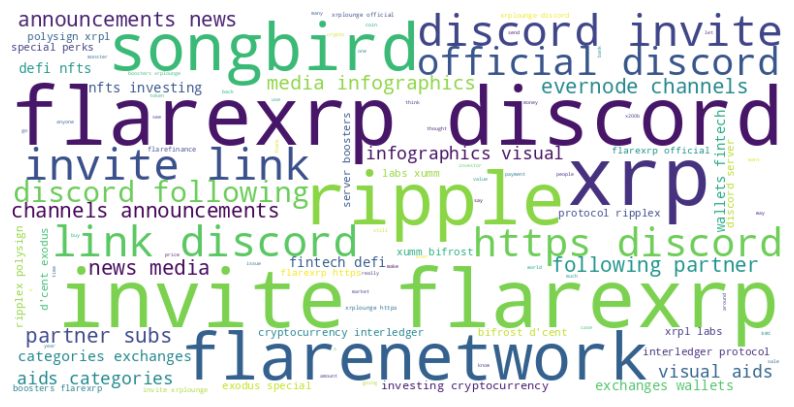

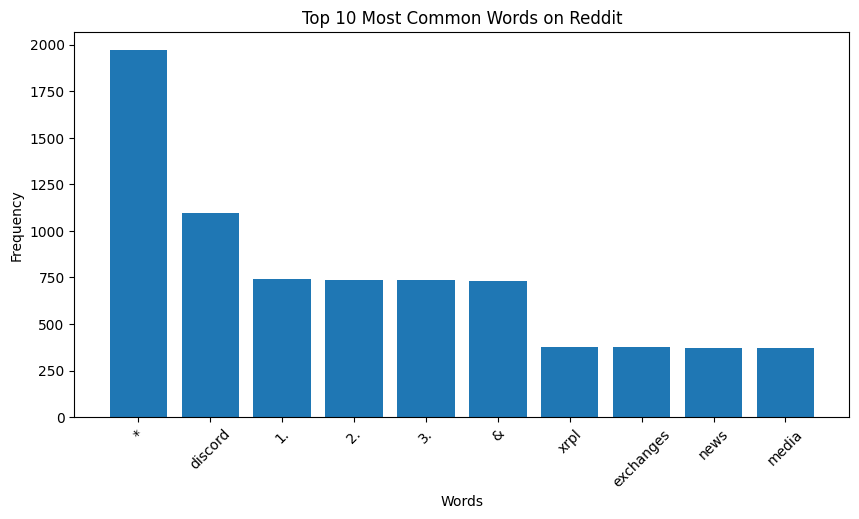

In [ ]:
from wordcloud import WordCloud
from collections import Counter
import nltk
from nltk.corpus import stopwords

nltk.download("stopwords")
stop_words = set(stopwords.words("english"))

text = ' '.join(filtered_text['selftext'].tolist())
text = text.lower()
text = text.split()
words = [word for word in text if word not in stop_words]
text = " ".join(words)
word_counter = Counter(text.split())
wordcloud = WordCloud(width=800, height=400, max_words=100, background_color='white').generate(text)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.savefig(f'body_wordcloud_{coin}.png')

plt.show()

# Get the top 10 most common words
top_10_words = word_counter.most_common(10)

# Extract the words and their frequencies for the vertical bar plot
words, frequencies = zip(*top_10_words)

# Plot the top 10 words in a vertical bar plot
plt.figure(figsize=(10, 5))
plt.bar(words, frequencies)
plt.xlabel("Words")
plt.ylabel("Frequency")
plt.title("Top 10 Most Common Words on Reddit")
plt.xticks(rotation=45)
plt.savefig(f'body_10top_{coin}.png')
plt.show()








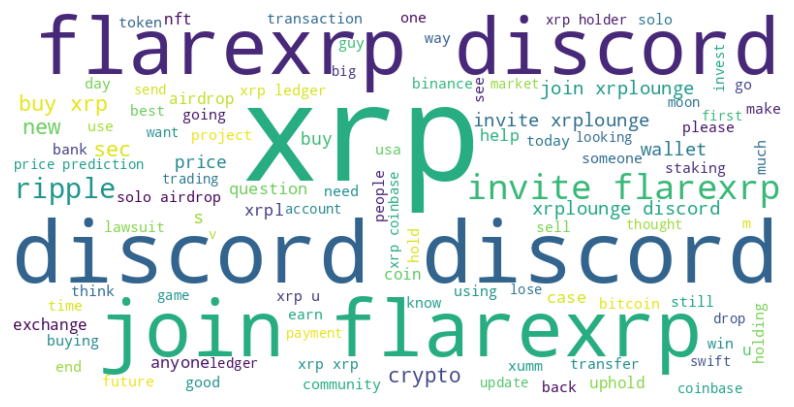

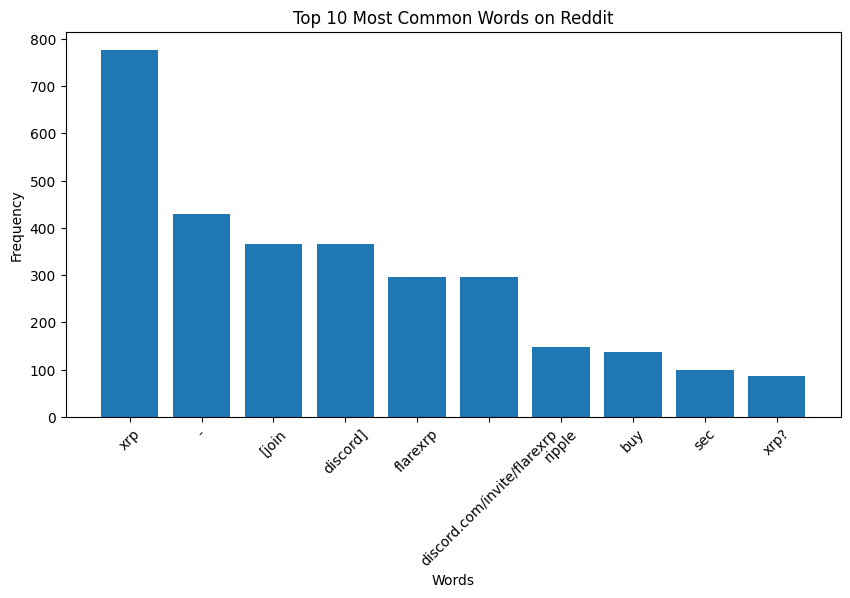

In [ ]:
text = ' '.join(filtered['title'].tolist())
text = text.lower()
text = text.split()
words = [word for word in text if word not in stop_words]
text = " ".join(words)
word_counter = Counter(text.split())
wordcloud = WordCloud(width=800, height=400, max_words=100, background_color='white').generate(text)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.savefig(f'title_wordcloud_{coin}.png')
plt.show()

# Get the top 10 most common words
top_10_words = word_counter.most_common(10)

# Extract the words and their frequencies for the vertical bar plot
words, frequencies = zip(*top_10_words)

# Plot the top 10 words in a vertical bar plot
plt.figure(figsize=(10, 5))
plt.bar(words, frequencies)
plt.xlabel("Words")
plt.ylabel("Frequency")
plt.title("Top 10 Most Common Words on Reddit")
plt.xticks(rotation=45)
plt.savefig(f'title_10top_{coin}.png')

plt.show()



In [ ]:
filtered_text['sentiment'] = filtered_text['selftext'].apply(lambda x: sia.polarity_scores(x))
filtered_text['T_sentiment'] = filtered_text['title'].apply(lambda x: sia.polarity_scores(x))

In [ ]:
def get_sentiment(scores):
  score = scores['compound']
  if score >= 0.05:
      sentiment = 1
  elif score <= -0.05:
      sentiment = -1
  else:
      sentiment = 0
  return sentiment

filtered_text['sentiment_score'] = filtered_text['sentiment'].apply(lambda x: get_sentiment(x))
filtered_text['T_sentiment_score'] = filtered_text['T_sentiment'].apply(lambda x: get_sentiment(x))
filtered_text.set_index('Date', inplace=True)


Postes Text Sentiment analysis

In [ ]:
freq = '7D'

In [ ]:
def get_corr(grouped_df,col):
  score = grouped_df.reset_index().iloc[:,:]
  score['price'] = coin_df.values
  # Calculate the correlation coefficient
  correlation = score[col].corr(score['price'])

  print("Correlation coefficient:", correlation)

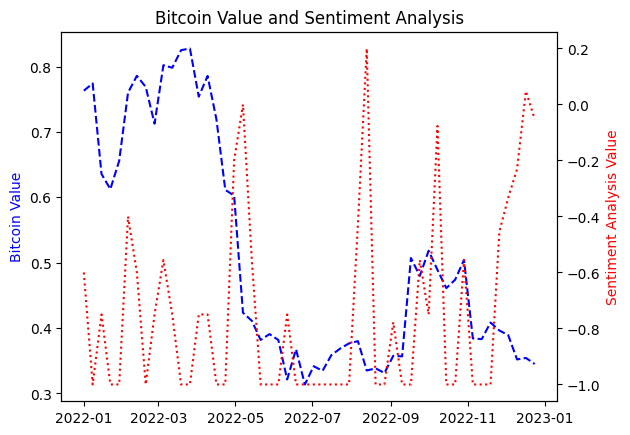

Correlation coefficient: -0.08483703150660588


In [ ]:
filtered_df = filtered_text[filtered_text['sentiment_score'] != 0]
grouped_df = filtered_df.groupby(pd.Grouper(freq=freq))['sentiment_score'].mean().to_frame().iloc[:-1,:]
img_title = f'Body_Sentiment_{coin}'
plot_twinx(grouped_df,'sentiment_score',img_title)
get_corr(grouped_df,'sentiment_score')

Postes Ttile Sentiment analysis

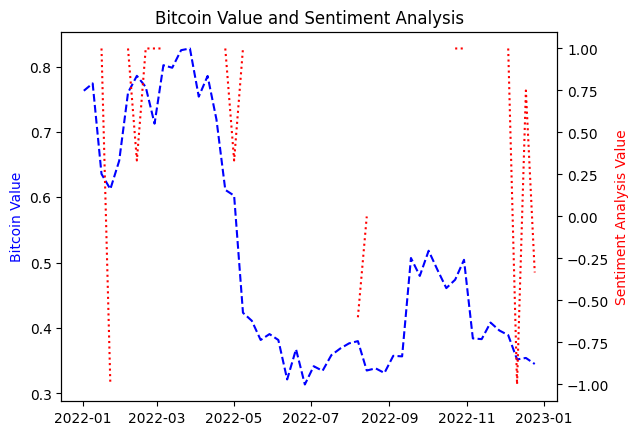

Correlation coefficient: 0.08404159511876373


In [ ]:
filtered_df = filtered_text[filtered_text['T_sentiment_score'] != 0]

grouped_df = filtered_df.groupby(pd.Grouper(freq=freq))['T_sentiment_score'].mean().to_frame().iloc[:,:]
img_title = f'Title_Sentiment_{coin}'
plot_twinx(grouped_df,'T_sentiment_score',img_title)
get_corr(grouped_df,'T_sentiment_score')

Emotions

Postes Number of Comments analysis

In [ ]:
filtered.set_index('Date', inplace=True)


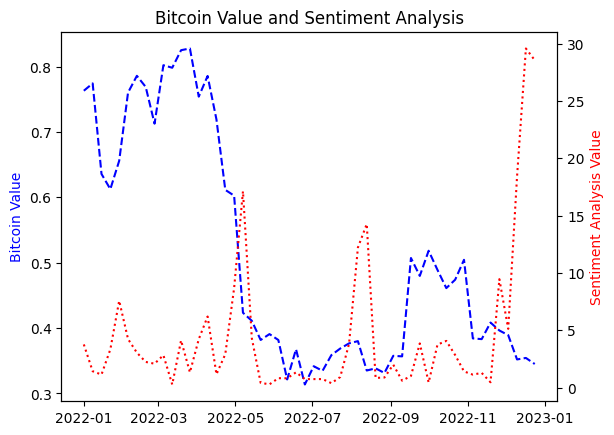

Correlation coefficient: -0.1819497659107231


In [ ]:
grouped_df = filtered.groupby(pd.Grouper(freq=freq))['num_comments'].mean().to_frame().iloc[:-1,:]
img_title = f'Comments_{coin}'
plot_twinx(grouped_df,'num_comments',img_title)
get_corr(grouped_df,'num_comments')

Postes Count analysis

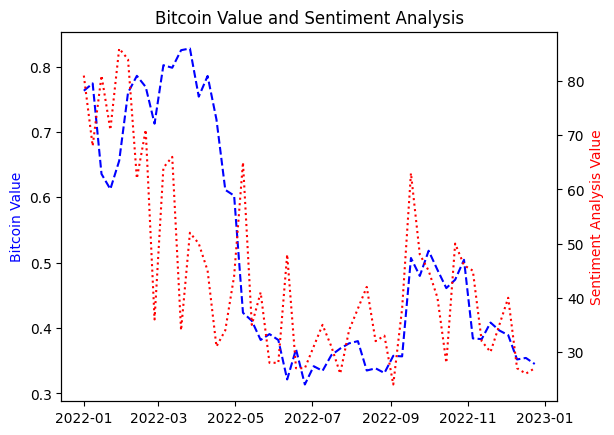

Correlation coefficient: 0.6430789532178812


In [ ]:
grouped_df = filtered.groupby(pd.Grouper(freq=freq)).count().iloc[:-1,:]
img_title = f'Posts_count_{coin}'
plot_twinx(grouped_df,'num_comments',img_title)
get_corr(grouped_df,'num_comments')

the length of the text

In [ ]:
filtered['Len_text'] = filtered['selftext'].apply(lambda x: len(x))

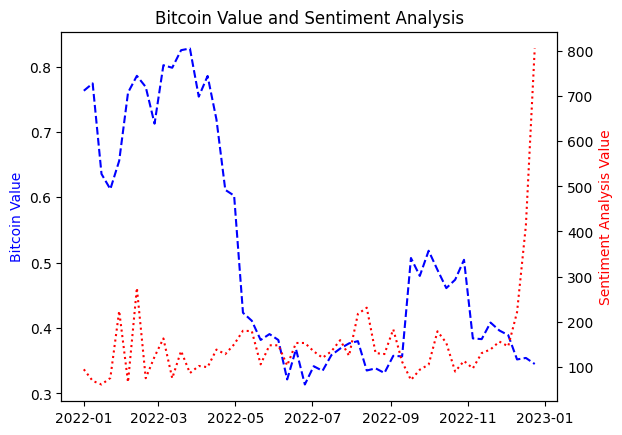

Correlation coefficient: -0.2718519125925086


In [ ]:
grouped_df = filtered.groupby(pd.Grouper(freq=freq))['Len_text'].mean().to_frame().iloc[:-1,:]
img_title = f'Text_len_{coin}'
plot_twinx(grouped_df,'Len_text',img_title)
get_corr(grouped_df,'Len_text')

In [ ]:
!pip install pytrends

# Trends versus Coin correlation

In [ ]:
from pytrends.request import TrendReq

# Create pytrends object
pytrends = TrendReq(hl='en-US', tz=360)

# Set up the search parameters
kw_list = ['Dogecoin']
timeframe = '2018-01-01 2022-12-31'
geo = ''

# Get Google Trends data
pytrends.build_payload(kw_list, timeframe=timeframe, geo=geo)
trends_data = pytrends.interest_over_time()

# Print the Google Trends data
trends_data = trends_data.reset_index()

trends = trends_data.drop(['isPartial'],axis=1)

trends.columns = ['date','coin']

trends.set_index('date', inplace=True)

In [ ]:
score = trends.reset_index()

In [ ]:
all_coin = pd.DataFrame()
all_coin['BTC'] = get_coin_value('DOGE')
all_coin = all_coin.iloc[1:,:]
coin = kw_list[0]

[*********************100%***********************]  1 of 1 completed


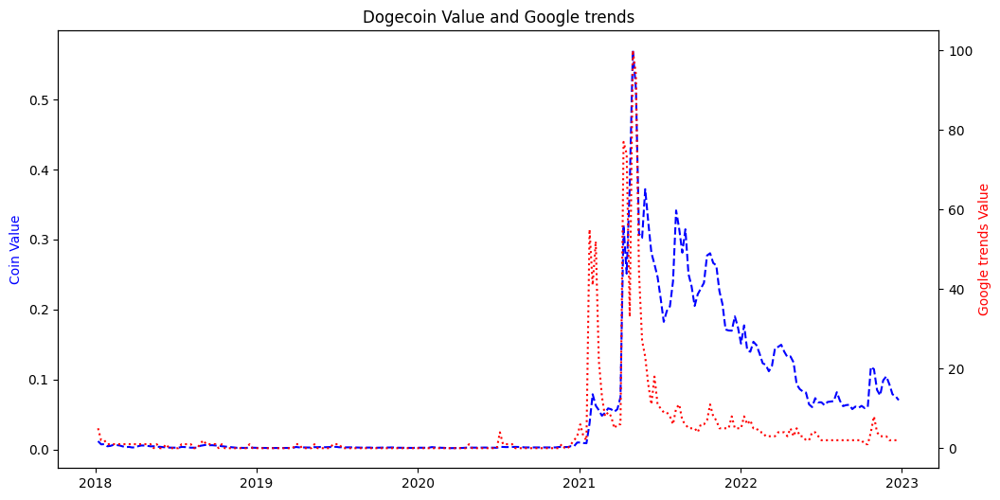

In [ ]:
# Create a figure and two axes
fig, ax1 = plt.subplots(figsize = (12,6))

# Plot coin values on the left axis
ax1.plot(trends.index, all_coin['BTC'], color='blue',linestyle='--')
ax1.set_ylabel('Coin Value', color='blue')

# Create a twin axes for sentiment analysis values on the right
ax2 = ax1.twinx()
ax2.plot(trends.index,  trends.coin, color='red',linestyle=':')
ax2.set_ylabel('Google trends Value', color='red')

# Set plot title and labels
plt.title(f'{coin} Value and Google trends')
plt.xlabel('Date')
plt.savefig(f'Trends_{coin}.png')

# Display the plot
plt.show()

In [ ]:
from scipy.stats import spearmanr


# Calculate the Spearman correlation coefficient and p-value
correlation, p_value = spearmanr(score['coin'],  all_coin['BTC'])

print("Spearman correlation coefficient:", correlation)
print("p-value:", p_value)


Spearman correlation coefficient: 0.9013982666479157
p-value: 8.952494613153095e-96


# Trends graph

In [ ]:
#import the libraries
import pandas as pd
from pytrends.request import TrendReq
from google.colab import files

#build model
pytrend = TrendReq()

#provide your search terms
kw_list=['Bitcoin']
pytrend.build_payload(kw_list=kw_list)


#get related queries
related_queries = pytrend.related_queries()
related_queries.values()

#build lists dataframes

top = list(related_queries.values())[0]['top']
# rising = list(related_queries.values())[0]['rising']

#convert lists to dataframes

dftop = pd.DataFrame(top)

#join two data frames
allqueries = dftop

#function to change duplicates

cols=pd.Series(allqueries.columns)
for dup in allqueries.columns[allqueries.columns.duplicated(keep=False)]:
    cols[allqueries.columns.get_loc(dup)] = ([dup + '.' + str(d_idx)
                                     if d_idx != 0
                                     else dup
                                     for d_idx in range(allqueries.columns.get_loc(dup).sum())]
                                    )
allqueries.columns=cols

#rename to proper names

allqueries.rename({'query': 'top query', 'value': 'top query value', 'query.1': 'related query', 'value.1': 'related query value'}, axis=1, inplace=True)

#check your dataset
allqueries.head(50)

#save to csv
allqueries.to_csv('allqueries.csv')

#download from collab
files.download("allqueries.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
coins = ['dogecoin','ethereum','litecoin','binance','bitcoin','xrp','caradano']
all_lst = []
for topic in coins:
  df = pd.read_csv(f'/content/{topic}.csv')
  query = df['top query'].to_list()
  for i in query:
    all_lst.append((topic,i))


In [ ]:
import networkx as nx

def create_graph_from_tuple(tuple_list):
    G = nx.Graph()

    for tup in tuple_list:
        node1, node2 = tup
        G.add_edge(node1, node2)

    return G

# Create the graph
graph = create_graph_from_tuple(all_lst)



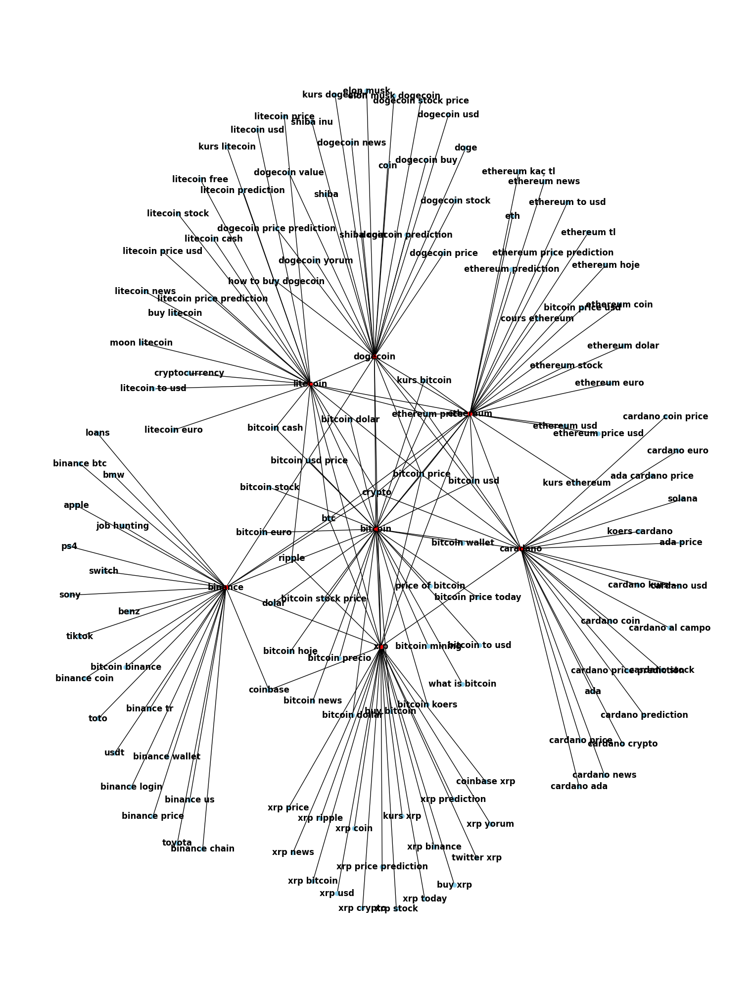

In [ ]:
plt.figure(figsize=(15, 20))  # Adjust the width and height as needed
# Draw the graph (optional)

nx.draw_kamada_kawai(graph, with_labels=True, node_size=35, node_color=["red" if node in coins else "skyblue" for node in graph.nodes()],font_weight="bold")
plt.show()

# Google trends versus coin value - Country based Correlation

In [ ]:
!pip install pytrends

In [ ]:
from pytrends.request import TrendReq
def get_region_intrest(kw_list):
  pytrend = TrendReq()

  #search interest per region
  #run model for keywords (can also be competitors)
  pytrend.build_payload(kw_list, timeframe = '2018-01-01 2022-12-31')

  # Interest by Region
  regiondf = pytrend.interest_by_region()
  #looking at rows where all values are not equal to 0
  regiondf = regiondf[(regiondf != 0).all(1)]

  #drop all rows that have null values in all columns
  regiondf.dropna(how='all',axis=0, inplace=True)

  regiondf = regiondf.reset_index()

  regiondf['avg'] = (regiondf.iloc[:,-2] + regiondf.iloc[:,-1])/2

  return regiondf




In [ ]:
import yfinance as yf

def get_coin_value(coin_short_name):
    # Fetch Bitcoin data from Yahoo Finance
    btc = yf.download(f'{coin_short_name}-USD', start='2018-01-01', end='2022-12-31',interval='1wk')
    # Valid intervals: [1m, 2m, 5m, 15m, 30m, 60m, 90m, 1h, 1d, 5d, 1wk, 1mo, 3mo]
    return btc['Close']

In [ ]:
import pandas as pd

all_coin = pd.DataFrame()
all_coin['DOGE'] = get_coin_value('DOGE')
all_coin['BTC'] = get_coin_value('BTC')
all_coin['XRP'] = get_coin_value('XRP')
all_coin['ETH'] = get_coin_value('ETH')

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


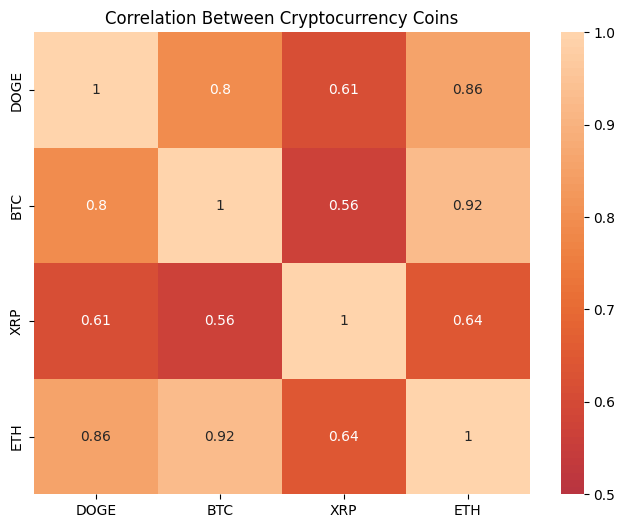

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

correlation_matrix = all_coin.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix,vmin=0.5,vmax=1.00, annot=True, center=0)
plt.title('Correlation Between Cryptocurrency Coins')
plt.show()


In [ ]:
!pip install pycountry

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 13.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pycountry: filename=pycountry-22.3.5-py2.py3-none-any.whl size=10681831 sha256=f9697b87adc174d82ed4b6c57f0832411874eb13979f6651069f3565135a09a7
  Stored in directory: /root/.cache/pip/wheels/03/57/cc/290c5252ec97a6d78d36479a3c5e5ecc76318afcb241ad9dbe
Successfully built pycountry


In [ ]:
import pycountry

def get_country_code(country_name):
    try:
        # Use pycountry to get the country object based on the full name
        country = pycountry.countries.get(name=country_name)
        if country:
            return country.alpha_2
        else:
            return None
    except LookupError:
        return None


In [ ]:
total_list = []
kw_list=[('Bitcoin','BTC'),('Dogecoin','DOGE'),('Ripple','XRP'),('Litecoin','LTC'),('Binancecoin','BNB'),('Cardano','ADA'),('Ethereum','ETH')]

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import spearmanr

kw_list=[('Bitcoin','BTC')]
for kw in kw_list:
  df = get_region_intrest([kw[0],kw[1]])
  coin = kw[1]
  countries = df.geoName
  coin_df = get_coin_value(kw[1])
  corr_lst = []
  for c in countries:
    try:
      # Create pytrends object
      pytrends = TrendReq(hl='en-US', tz=360)

      # Set up the search parameters
      timeframe = '2018-01-01 2022-12-31'
      geo = get_country_code(c)

      # Get Google Trends data
      pytrends.build_payload([kw[0],kw[1]], timeframe=timeframe, geo=geo)
      trends_data = pytrends.interest_over_time()

      # Print the Google Trends data
      trends_data = trends_data.reset_index()

      trends = trends_data.drop(['isPartial'],axis=1)

      trends['avg'] = (trends.iloc[:,-2] + trends.iloc[:,-1])/2
      trends.columns = ['date','_','_2','coin']

      trends.set_index('date', inplace=True)

      score = trends.reset_index()
      if coin_df.shape[0] != score.shape[0]:
        coin_df = coin_df.iloc[:-1,]
      score['price'] = coin_df.values
      # Calculate the Spearman correlation coefficient and p-value
      correlation, p_value = spearmanr(score['coin'], score['price'])
      total_list.append((c,coin,correlation))
      # score['year'] = score['date'].dt.year
      # # Create a figure and two axes
      # fig, ax1 = plt.subplots(figsize=(18, 8))

      # # Plot coin values on the left axis
      # ax1.plot(trends.index, coin_df, color='blue',linestyle='--')
      # ax1.set_ylabel('Coin Value', color='blue')

      # # Create a twin axes for sentiment analysis values on the right
      # ax2 = ax1.twinx()
      # ax2.plot(trends.index,  trends.coin, color='red',linestyle=':')
      # ax2.set_ylabel('Google trends Value', color='red')

      # # Set plot title and labels
      # plt.title(f'{c}_{coin}')
      # plt.xlabel('Date')
      # # plt.savefig(f'{c}_{coin}.png')

      # # Display the plot
      # plt.show()
      # intrest = score.groupby('year')['coin'].mean().reset_index()
      # intrest.columns = ['year','mean_GT']
      # intrest['Country'] = [c]*5
      # intrest['Coin'] = [kw[1]]*5
      # correlations_by_year = score.groupby('year')['coin', 'price'].corr().iloc[0::2, -1]
      # # Convert the Series to a DataFrame for easier plotting
      # correlations_df = correlations_by_year.reset_index()
      # correlations_df.columns = ['Year','Coin', 'Correlation']
      # correlations_df['Country'] = [c]*5
      # correlations_df['Coin'] = [kw[1]]*5
      # concat_df_per_coin = pd.concat([concat_df_per_coin,intrest],axis=0)
    except Exception as e:
      print(f'Error with {kw[0]} - {c}')
      print(e)




[*********************100%***********************]  1 of 1 completed


In [ ]:
df = pd.DataFrame(total_list, columns=['Country', 'Coin', 'Corr'])

In [ ]:
coins = df['Coin'].unique()
for coin in coins:
    coin_df = df[df['Coin'] == coin]
    # Get the top 3 countries with the highest values
    top_countries = coin_df.nlargest(5, 'Corr')

    print(f'Top 5 countries for {coin}:')
    for index, row in top_countries.iterrows():
        print(f'{row["Country"]}: {row["Corr"]}')
    print('-'*20)

Top 5 countries for ETH:
Singapore: 0.9212212662693244
Canada: 0.9159541598993203
United States: 0.9157723861626516
Australia: 0.9110525277250555
New Zealand: 0.909135303364155
--------------------
Top 5 countries for XRP:
Canada: 0.8009575475188481
South Africa: 0.7898834297368017
United Kingdom: 0.783021014167214
Germany: 0.7526324894877903
Iran: 0.7463666867142794
--------------------
Top 5 countries for DOGE:
Germany: 0.8696456895970117
Iran: 0.8675151758020326
Russia: 0.8675151758020326
South Korea: 0.8675151758020326
Türkiye: 0.8675151758020326
--------------------
Top 5 countries for BTC:
Argentina: 0.8794947966792881
Cyprus: 0.860045776433356
Spain: 0.8581395431639686
Greece: 0.8450893110967417
Belgium: 0.842776909682119
--------------------


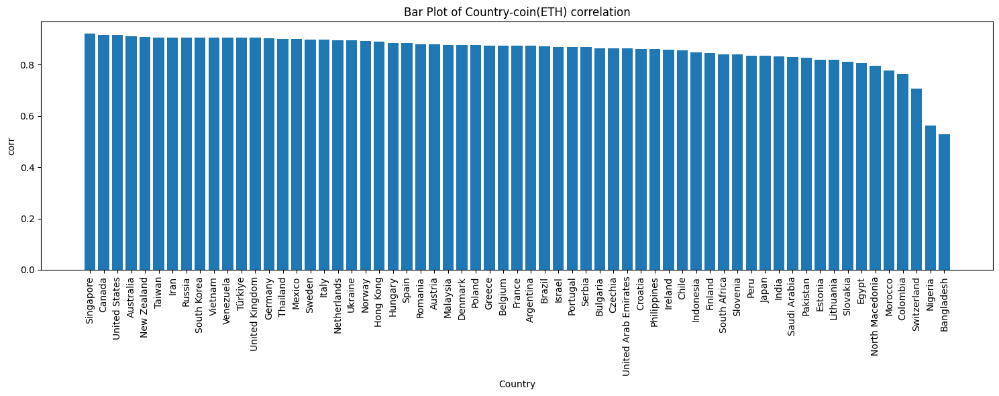

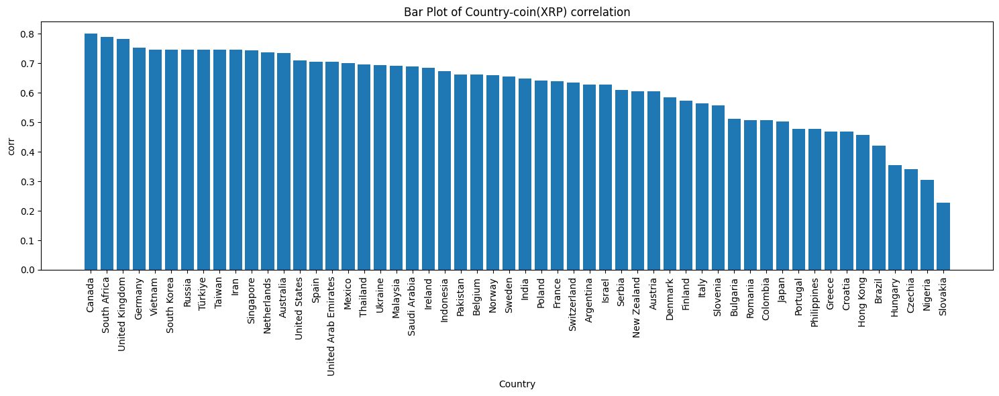

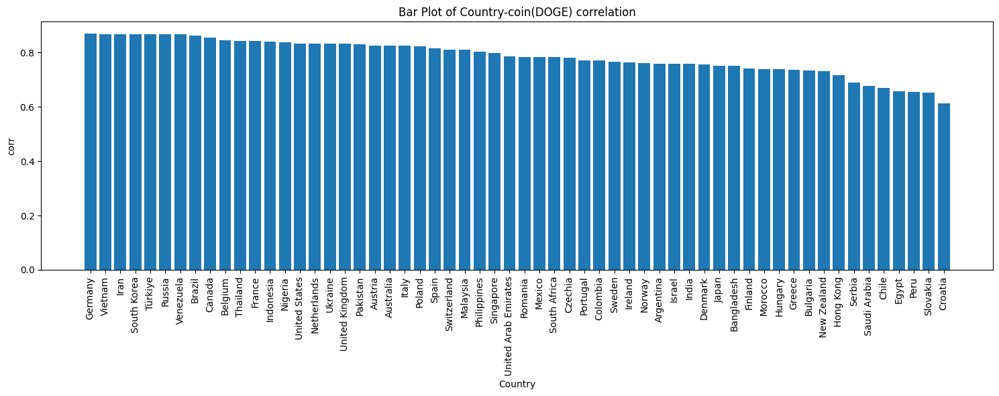

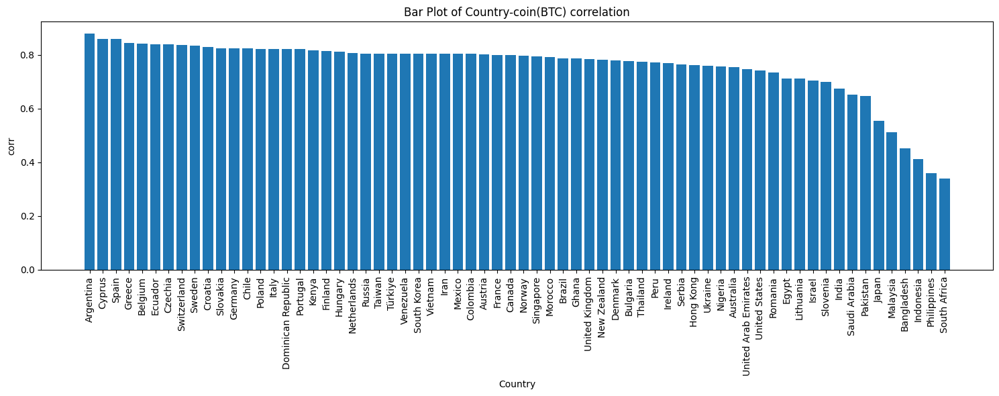

In [ ]:

coins = df['Coin'].unique()
for coin in coins:
    plt.figure(figsize=(15, 6))  # Optional: Adjust the figure size as needed
    coin_df = df[df['Coin'] == coin]
    # Sort the DataFrame by the 'value_2' column in descending order
    grouped_df = coin_df.sort_values(by='Corr', ascending=False)

    # Create the bar plot
    plt.bar(grouped_df['Country'], grouped_df['Corr'])

    # Optional: Customize the plot with labels and titles
    plt.xlabel('Country')
    plt.ylabel('corr')
    plt.title(f'Bar Plot of Country-coin({coin}) correlation')

    # Rotate the x-axis labels if you have many countries for better readability
    plt.xticks(rotation=90)

    # Show the plot
    plt.tight_layout()  # Optional: Adjust the layout for better visualization
    plt.show()

In [ ]:
concat_df = pd.concat([concat_df,concat_df_per_coin],axis = 0)

In [ ]:
concat_df.to_csv('GT_mean.csv')

In [ ]:
concat_df = pd.read_csv('GT_mean.csv')

In [ ]:
# Group by Country and Year, and find the coin with the highest value
result = concat_df.groupby(['Country', 'Coin'], as_index=False)['mean_GT'].sum()

# Reset index to match the original DataFrame and drop the old index column
result.reset_index(drop=True, inplace=True)



In [ ]:
# Create a bar plot for each country
coins = result['Coin'].unique()
for coin in coins:
    coin_df = result[result['Coin'] == coin]
    # Get the top 3 countries with the highest values
    top_countries = coin_df.nlargest(3, 'mean_GT')

    print(f'Top 3 countries for {coin}:')
    for index, row in top_countries.iterrows():
        print(f'{row["Country"]}: {row["mean_GT"]}')
    print('-'*20)

Top 3 countries for BTC:
Slovenia: 178.3846153846154
Nigeria: 177.16346153846155
Ghana: 162.625
--------------------
Top 3 countries for DOGE:
Bangladesh: 67.74038461538461
Indonesia: 46.53846153846155
Philippines: 43.00961538461539
--------------------
Top 3 countries for ETH:
Switzerland: 157.4519230769231
Japan: 115.75
Egypt: 114.24038461538461
--------------------
Top 3 countries for XRP:
Japan: 65.41346153846155
Hungary: 61.83653846153846
Thailand: 57.43269230769231
--------------------


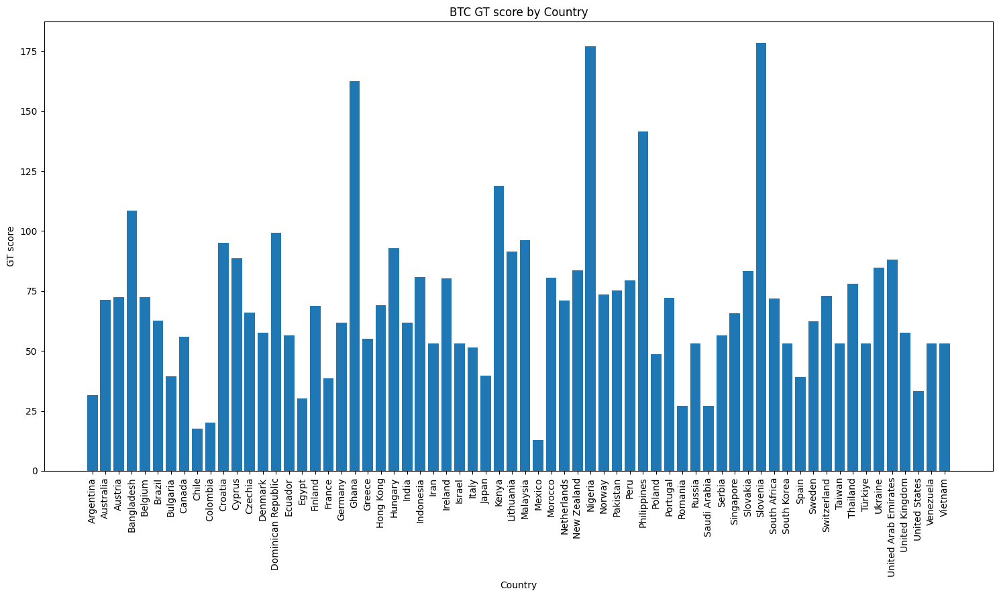

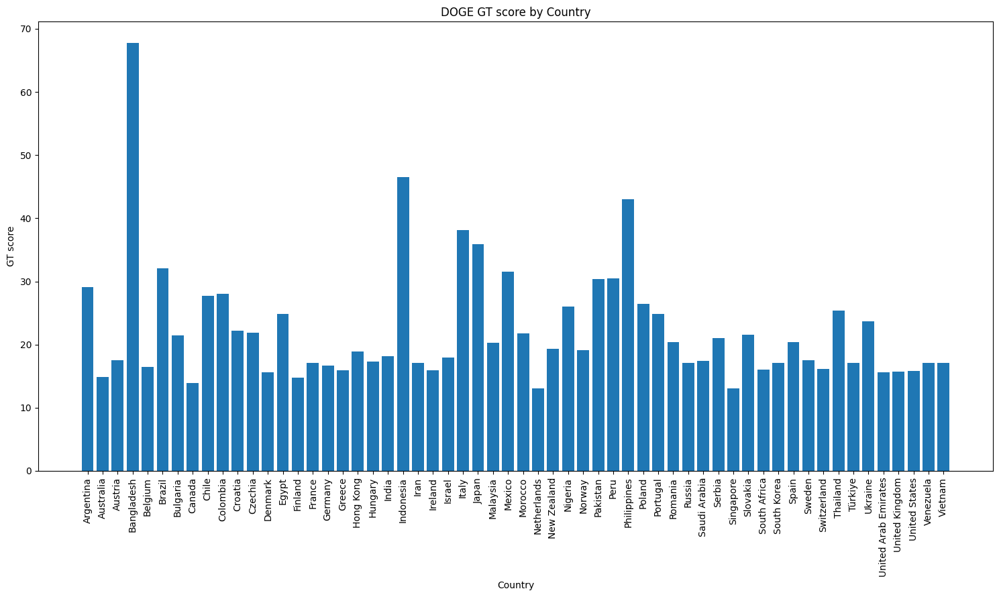

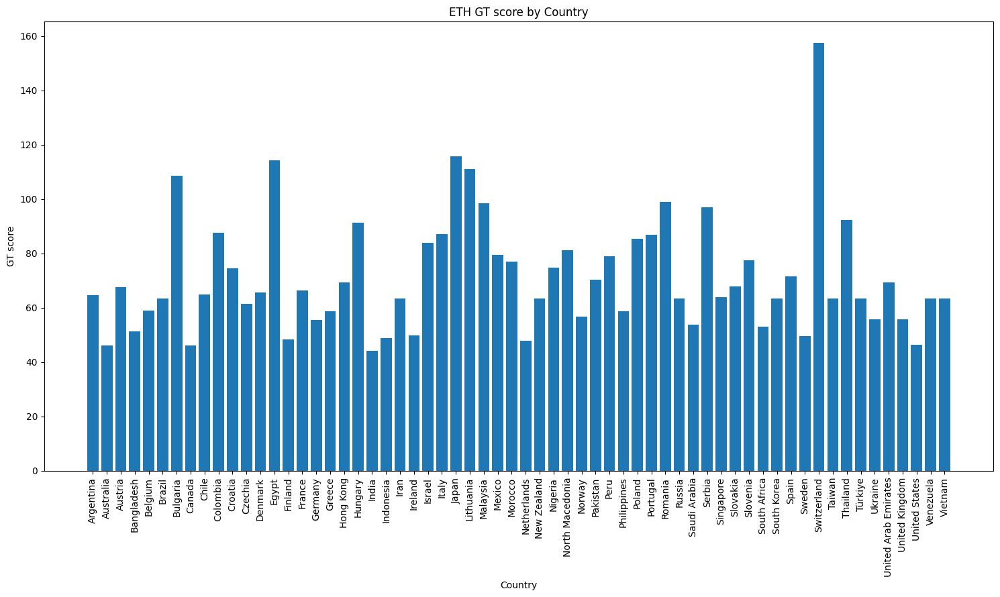

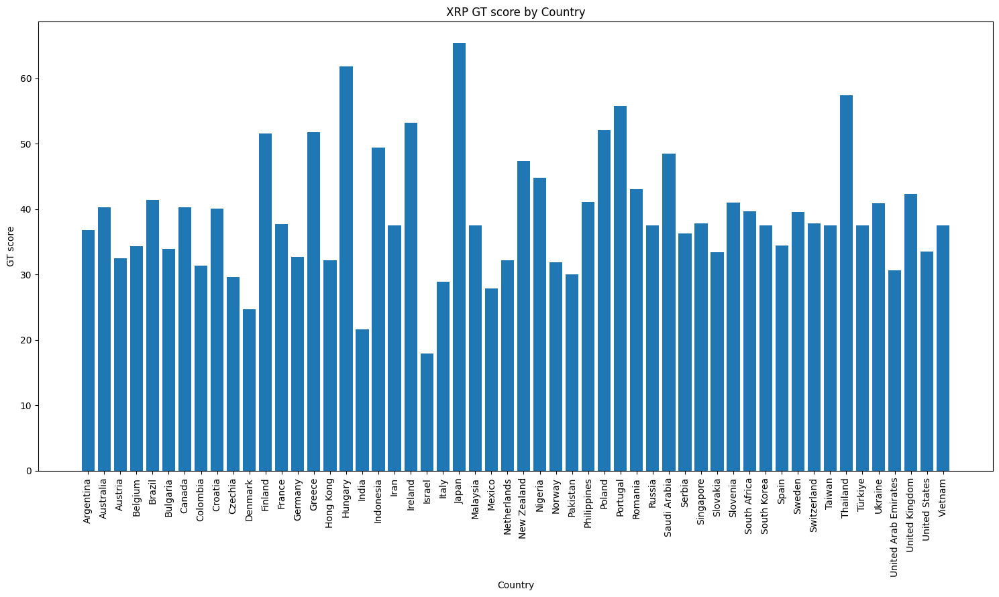

In [ ]:
# Create a bar plot for each country
coins = result['Coin'].unique()
for coin in coins:
    coin_df = result[result['Coin'] == coin]
    countries = coin_df['Country']
    values = coin_df['mean_GT']

    plt.figure(figsize=(15, 9))
    plt.bar(countries, values)
    plt.title(f'{coin} GT score by Country')
    plt.xlabel('Country')
    plt.ylabel('GT score')
    plt.xticks(rotation=90)
    plt.tight_layout()

    plt.show()


In [ ]:
# Group by Country and Year, and find the coin with the highest value
result = concat_df.groupby(['Country', 'year'], as_index=False)['mean_GT'].idxmax()

# Reset index to match the original DataFrame and drop the old index column
result.reset_index(drop=True, inplace=True)

# Create a dictionary to map coin names to labels (0, 1, 2, ...)
coin_labels = {coin: label for label, coin in enumerate(concat_df['Coin'].unique())}

# Add a new 'Coin Label' column to the result DataFrame
result['Coin Label'] = result.apply(lambda row: coin_labels[concat_df.loc[row['mean_GT']]['Coin']], axis=1)


In [ ]:
import plotly.express as px

min_year = 2018
max_year = 2022

# Manipulating the original dataframe
df_to_plot = result.copy()
df_to_plot = df_to_plot.sort_values('year', ascending=True)

# Creating the visualization
fig = px.choropleth(df_to_plot,
                    locations="Country" ,
                    locationmode="country names",
                    color='Coin Label',
                    animation_frame="year",
                    color_continuous_scale=px.colors.sequential.Plasma,
                  )

fig.update_layout(
    title_text = f'Countries Most searched coin according to GT {min_year}-{max_year}',
    title_x = 0.5,
    geo=dict(
        showframe = False,
        showcoastlines = False,
        countrycolor ='#444444',
        showcountries = True
    ))

fig.show()

In [ ]:
coin_labels

{'BTC': 0, 'DOGE': 1, 'XRP': 2, 'ETH': 3}

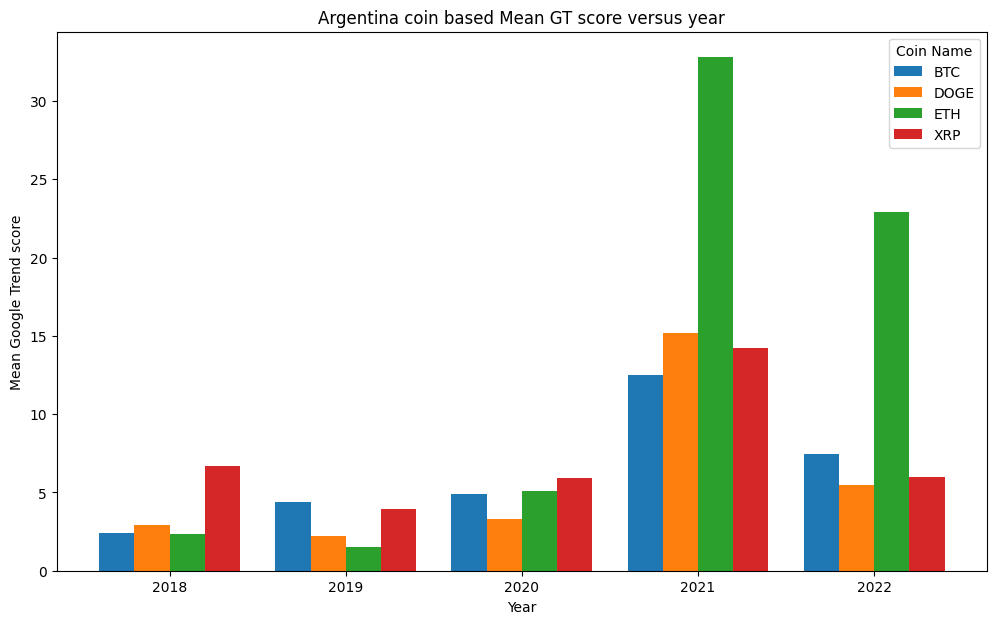

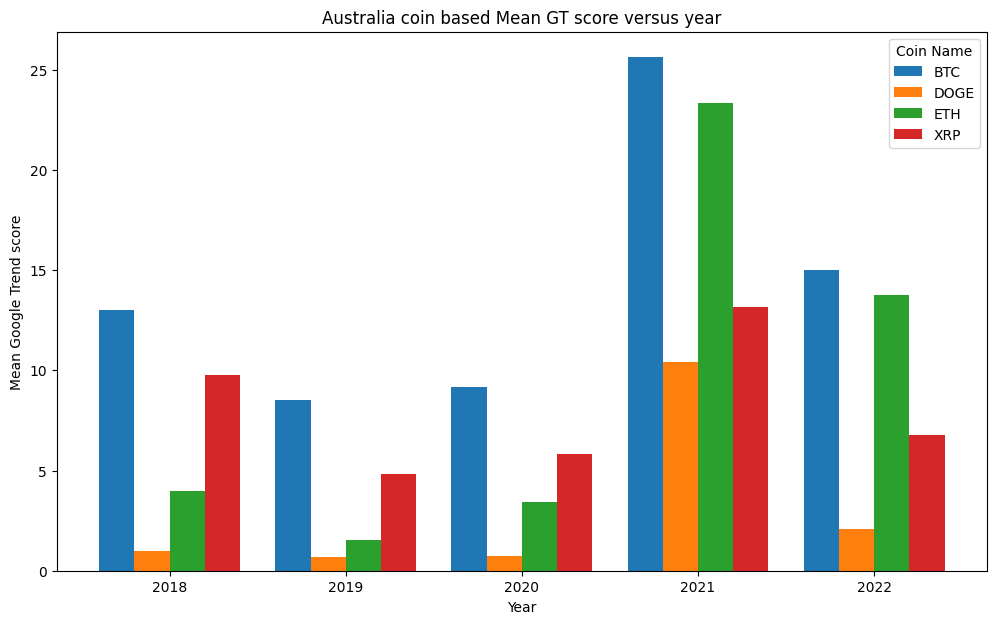

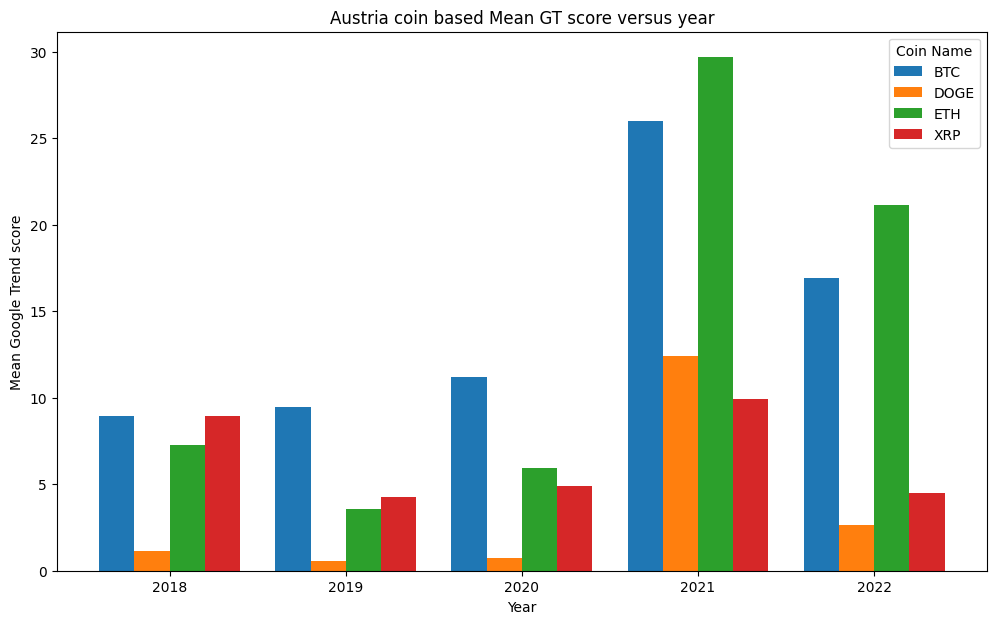

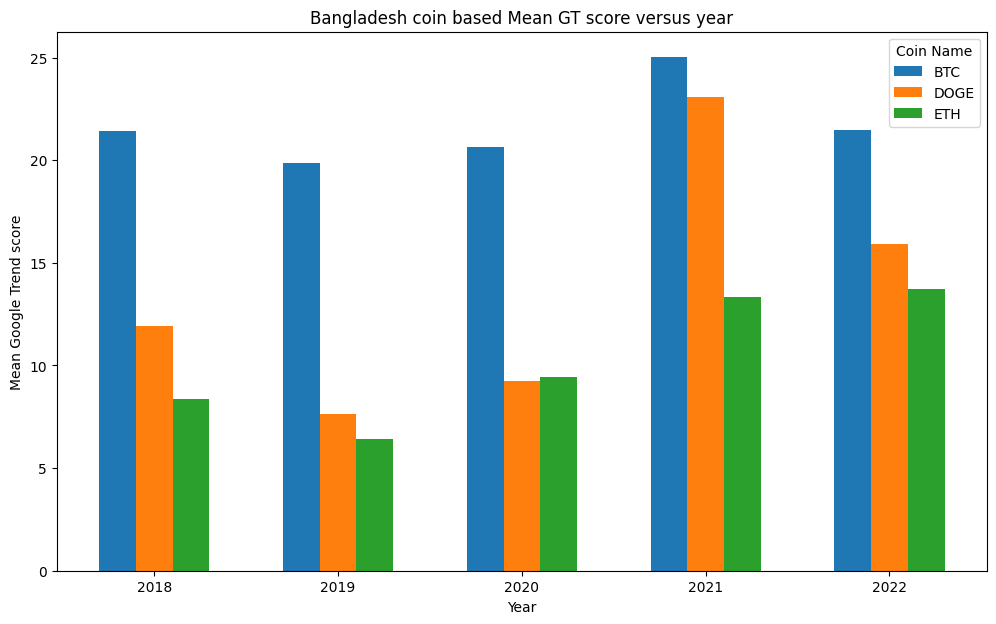

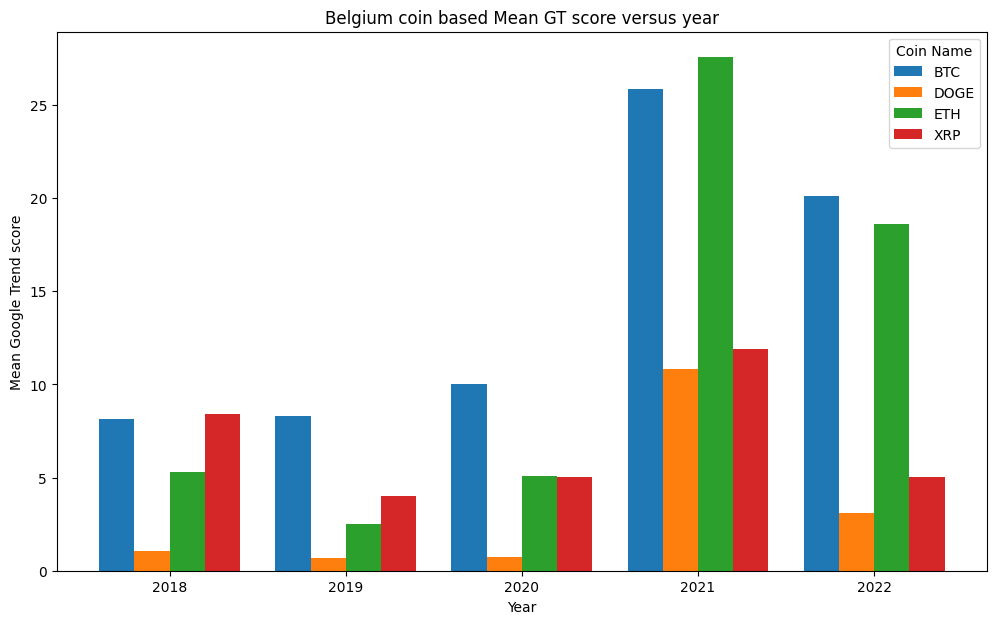

...

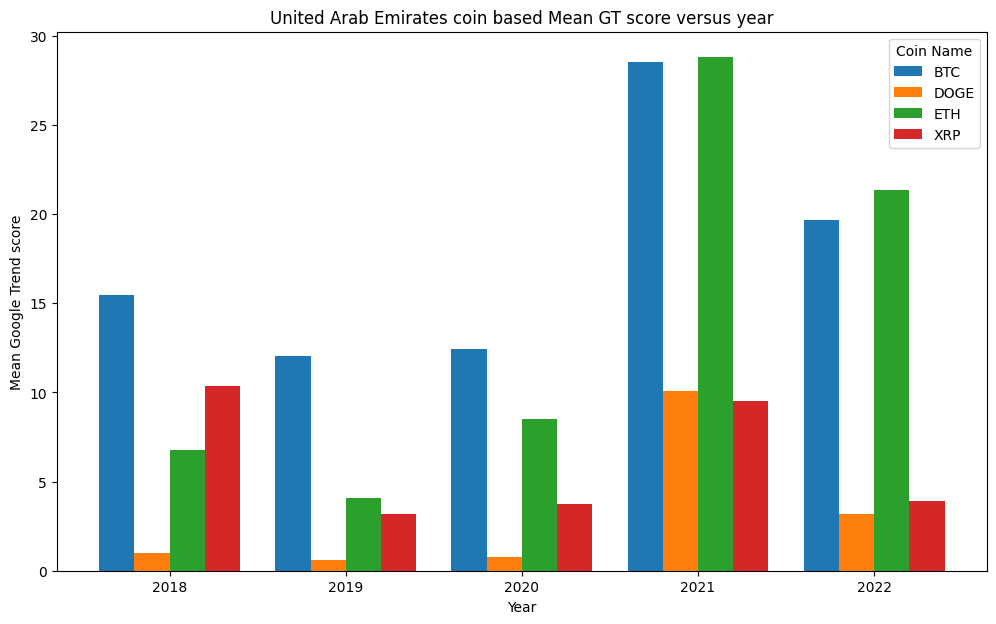

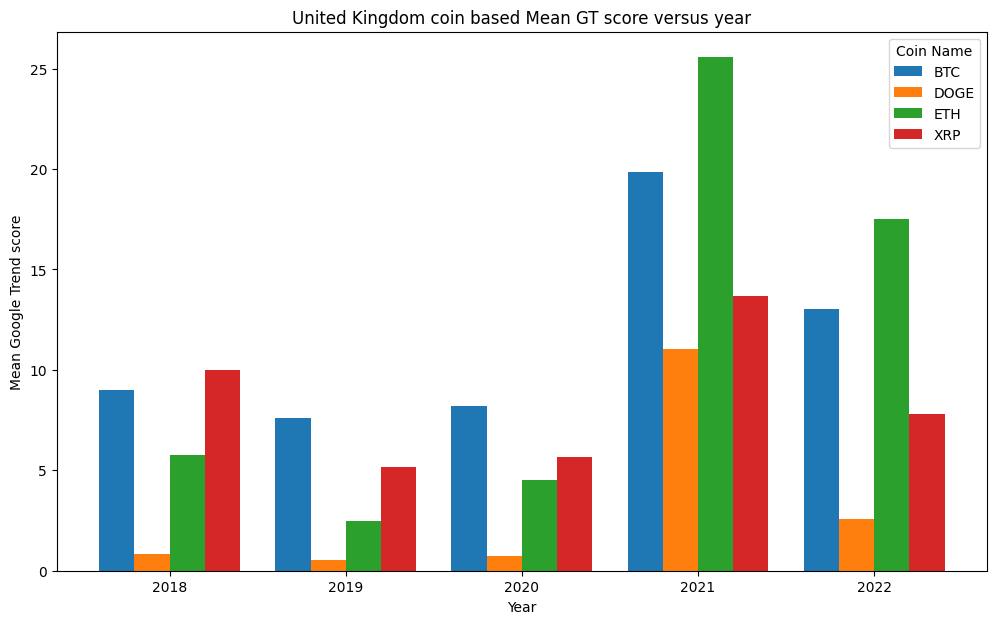

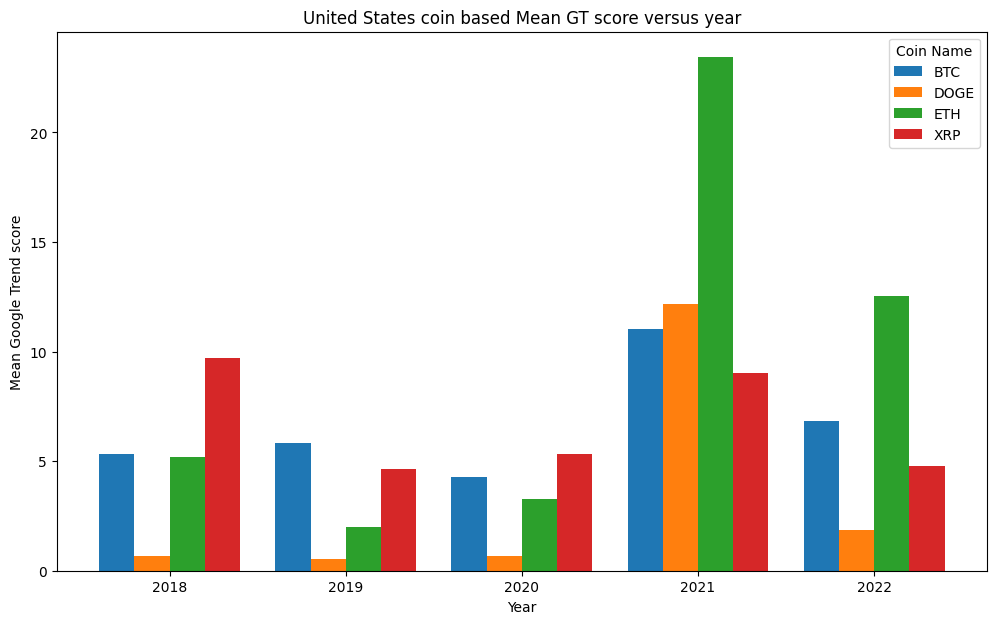

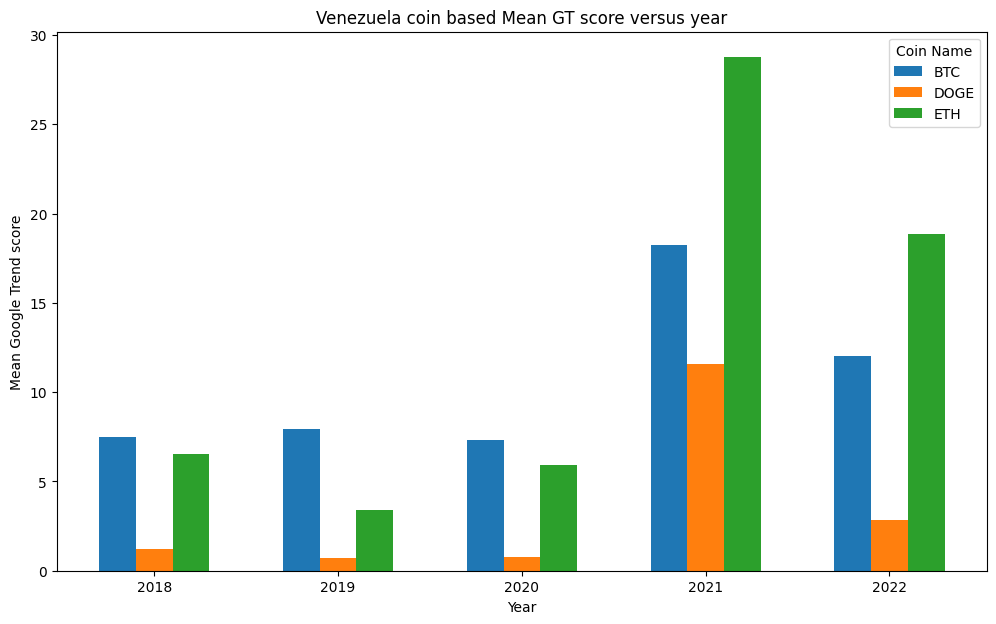

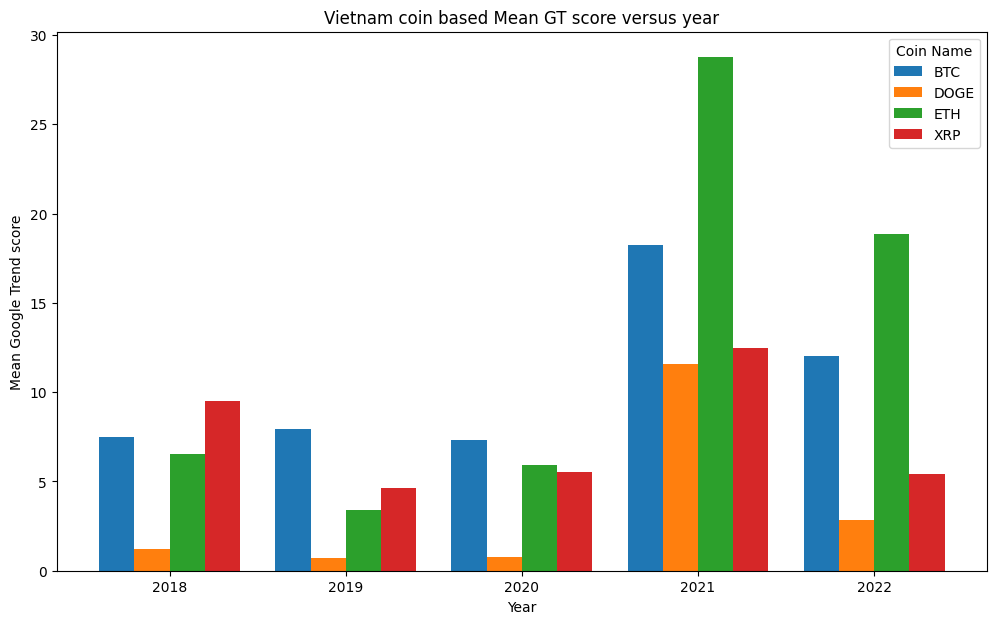

In [ ]:
import numpy as np
# Group the DataFrame by country, year, and coin_name
grouped = concat_df.groupby(['Country', 'year', 'Coin']).sum().reset_index()

# Create a bar plot for each country
countries = grouped['Country'].unique()
for country in countries:
    country_df = grouped[grouped['Country'] == country]

    years = country_df['year'].unique()
    coin_names = country_df['Coin'].unique()
    num_coins = len(coin_names)
    width = 0.2  # Adjust the width of the bars

    fig, ax = plt.subplots(figsize=(12, 7))
    for i, coin_name in enumerate(coin_names):
        values = country_df[country_df['Coin'] == coin_name]['mean_GT']
        x = np.arange(len(years)) + i * width
        ax.bar(x, values, width=width, label=coin_name)

    ax.set_title(f'{country} coin based Mean GT score versus year')
    ax.set_xlabel('Year')
    ax.set_ylabel('Mean Google Trend score')
    ax.set_xticks(np.arange(len(years)) + (num_coins - 1) * width / 2)
    ax.set_xticklabels(years)
    ax.legend(title='Coin Name')

    # Save the figure
    filename = f'{country}_coin_values.png'
    plt.savefig(filename)

    plt.show()

In [ ]:
coins = ['BTC', 'DOGE', 'XRP','ETH']

for coin in coins:
  df_coin = concat_df[concat_df['Coin'] == coin]
  min_year = 2018
  max_year = 2022

  # Manipulating the original dataframe
  df_to_plot = df_coin.copy()
  df_to_plot = df_to_plot.sort_values('year', ascending=True)

  # Creating the visualization
  fig = px.choropleth(df_to_plot,
                      locations="Country" ,
                      locationmode="country names",
                      color='mean_GT',
                      animation_frame="year",
                      color_continuous_scale=px.colors.sequential.Plasma,
                    )

  fig.update_layout(
      title_text = f'Google trend and {coin} Mean search score between {min_year}-{max_year}',
      title_x = 0.5,
      geo=dict(
          showframe = False,
          showcoastlines = False,
          countrycolor ='#444444',
          showcountries = True
      ))

  fig.show()

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
df = pd.read_csv('all_coins_2018_2022.csv').iloc[:,1:]

In [ ]:
df['Country'] = df['Country'].replace('Türkiye', 'turkey')


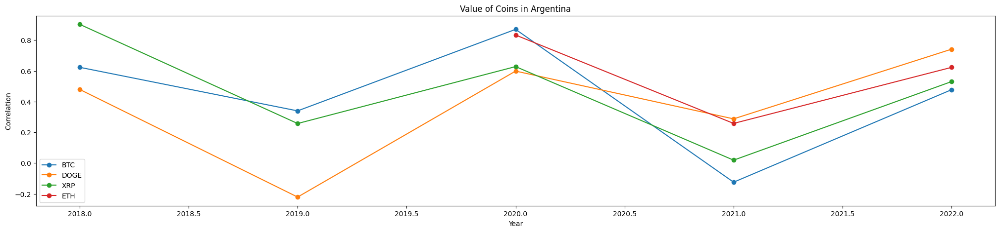

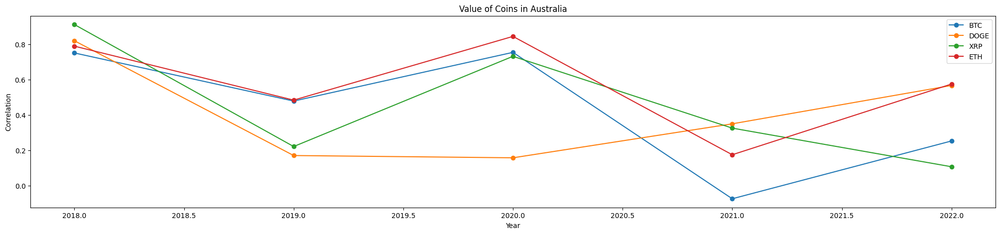

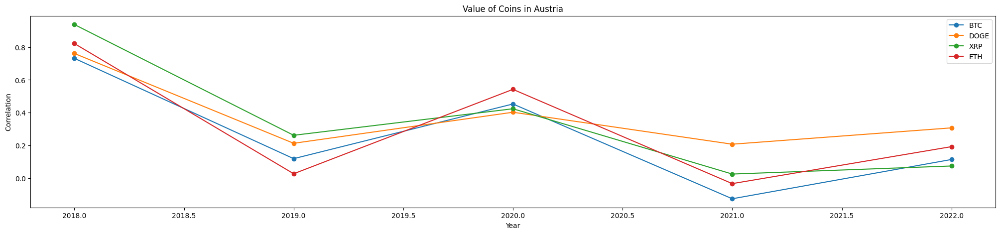

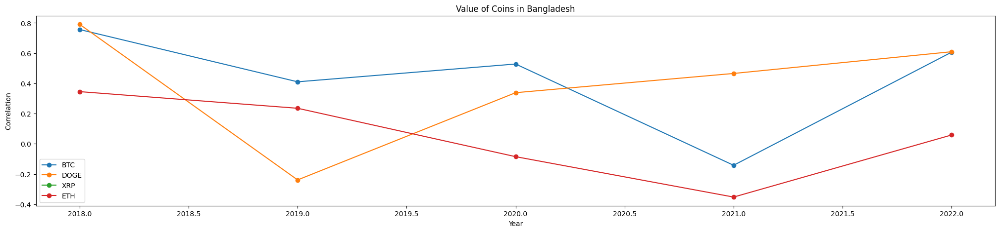

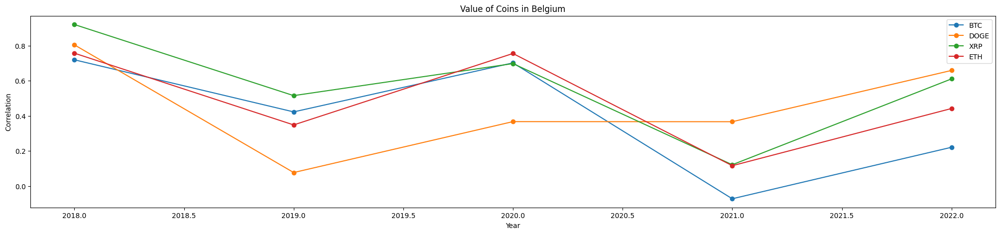

...

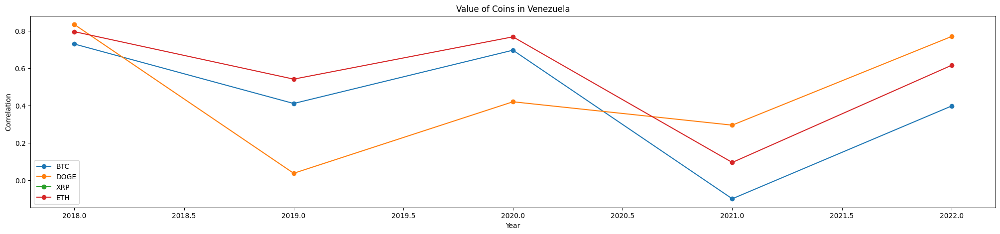

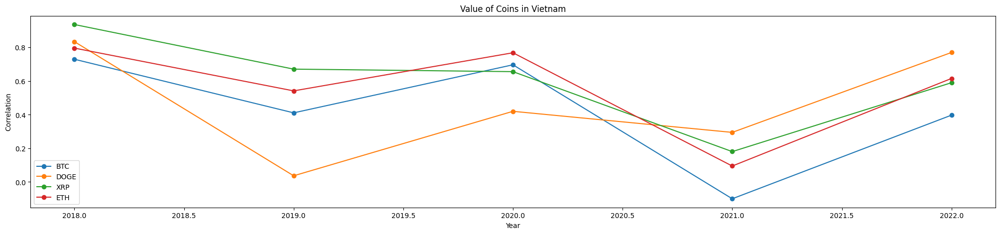

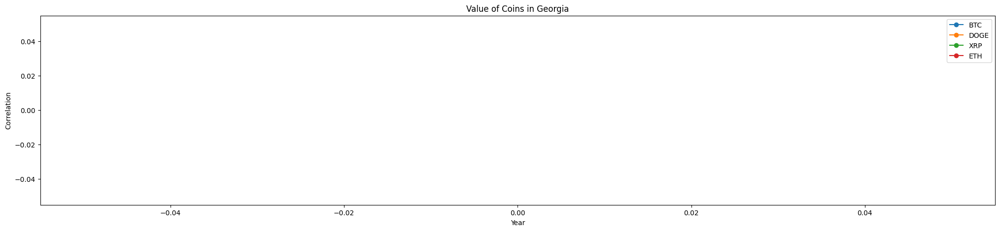

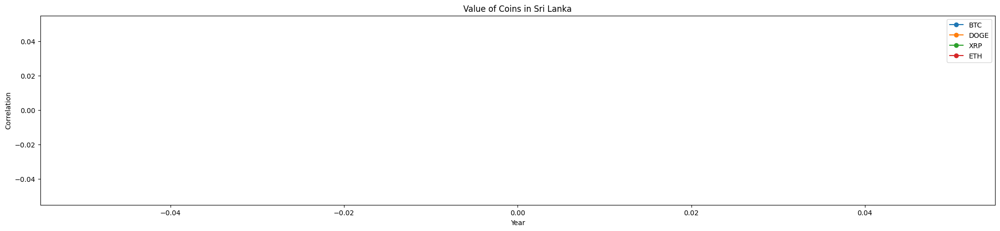

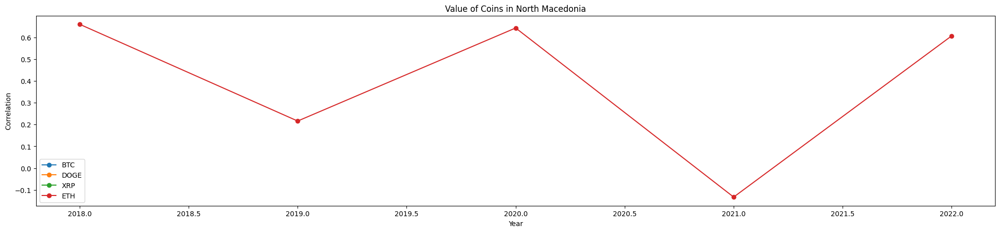

In [ ]:
import seaborn as sns  # This will help us apply different colors automatically

coins = ['BTC', 'DOGE', 'XRP','ETH']
countries = df['Country'].unique()

for c in countries:
  curr_df = df[df['Country'] == c]
  plt.figure(figsize=(25, 5))
  plt.title(f'Value of Coins in {c}')
  plt.xlabel('Year')
  plt.ylabel('Correlation')
  for coin in coins:
    curr_df_coin = curr_df[curr_df['Coin'] == coin]
    plt.plot(curr_df_coin['Year'], curr_df_coin['Correlation'], label = coin, marker = 'o')

  plt.legend()
  plt.savefig(f'{c}.png')
  plt.show()


In [ ]:
import plotly.express as px

for coin in coins:
  df_coin = df[df['Coin'] == coin]
  min_year = 2018
  max_year = 2022

  # Manipulating the original dataframe
  df_to_plot = df_coin.copy()
  df_to_plot = df_to_plot.sort_values('Year', ascending=True)

  # Creating the visualization
  fig = px.choropleth(df_to_plot,
                      locations="Country" ,
                      locationmode="country names",
                      color='Correlation',
                      animation_frame="Year",
                      color_continuous_scale=px.colors.sequential.Plasma,
                    )

  fig.update_layout(
      title_text = f'Google trend and {coin} Correlation between {min_year}-{max_year}',
      title_x = 0.5,
      geo=dict(
          showframe = False,
          showcoastlines = False,
          countrycolor ='#444444',
          showcountries = True
      ))

  fig.show()

In [ ]:
regiondf = regiondf.reset_index()
fig = px.choropleth(regiondf, locations="geoName",
                    color="corr",
                    locationmode="country names",
                    color_continuous_scale=px.colors.sequential.Plasma)
fig.show()

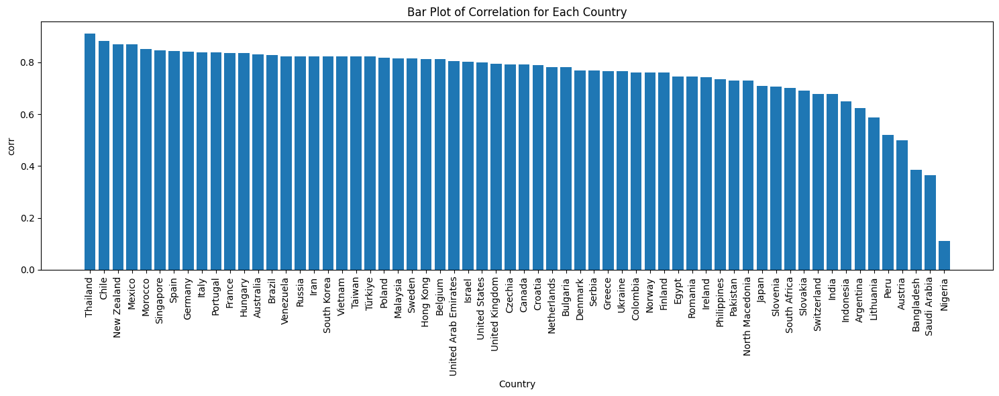

In [ ]:
plt.figure(figsize=(15, 6))  # Optional: Adjust the figure size as needed

# Group the DataFrame by 'country' and calculate the mean of 'value_2' for each country
grouped_df = regiondf.groupby('geoName')['corr'].mean().reset_index()

# Sort the DataFrame by the 'value_2' column in descending order
grouped_df = grouped_df.sort_values(by='corr', ascending=False)

# Create the bar plot
plt.bar(grouped_df['geoName'], grouped_df['corr'])

# Optional: Customize the plot with labels and titles
plt.xlabel('Country')
plt.ylabel('corr')
plt.title('Bar Plot of Correlation for Each Country')

# Rotate the x-axis labels if you have many countries for better readability
plt.xticks(rotation=90)

# Show the plot
plt.tight_layout()  # Optional: Adjust the layout for better visualization
plt.show()

In [ ]:
df = pd.read_csv('all_coins_2018_2022.csv')

In [ ]:
grouped_mean = df.groupby(['Year', 'Coin'])['Correlation'].mean().reset_index()
coins_to_keep = ['BTC','ETH','DOGE','XRP']

# Filter the DataFrame to keep rows with 'coin' values in the list
filtered_df = grouped_mean[grouped_mean['Coin'].isin(coins_to_keep)]

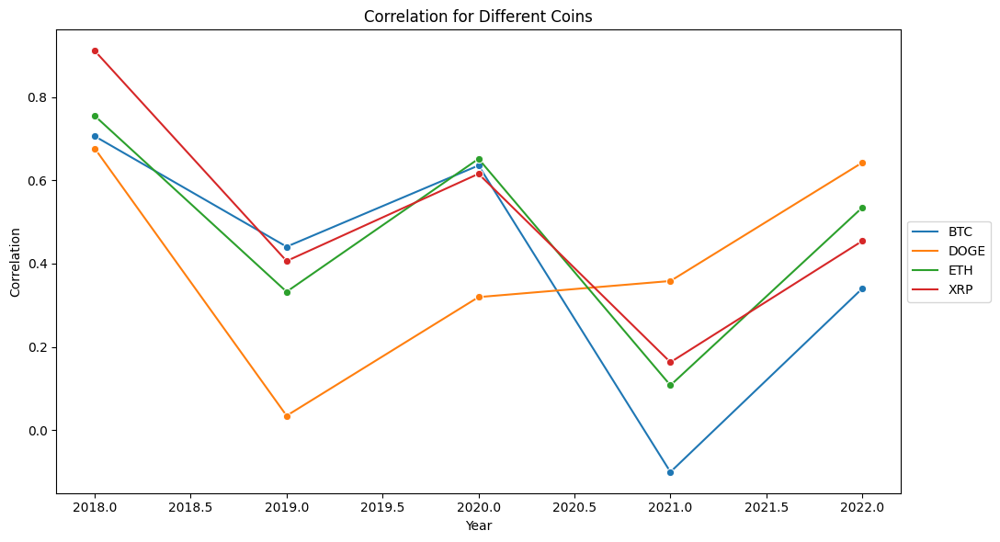

In [ ]:
plt.figure(figsize=(10, 6))

# Create a line plot for each coin
sns.lineplot(data=filtered_df, x='Year', y='Correlation', hue='Coin', marker='o')

plt.title('Correlation for Different Coins')
plt.xlabel('Year')
plt.ylabel('Correlation')
plt.tight_layout()

# Place the legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

In [ ]:
!zip -r /content/all.zip /content/

  adding: content/ (stored 0%)
  adding: content/.config/ (stored 0%)
  adding: content/.config/active_config (stored 0%)
  adding: content/.config/configurations/ (stored 0%)
  adding: content/.config/configurations/config_default (deflated 15%)
  adding: content/.config/.last_update_check.json (deflated 24%)
  adding: content/.config/.last_opt_in_prompt.yaml (stored 0%)
  adding: content/.config/config_sentinel (stored 0%)
  adding: content/.config/logs/ (stored 0%)
  adding: content/.config/logs/2023.08.10/ (stored 0%)
  adding: content/.config/logs/2023.08.10/19.17.49.796317.log (deflated 91%)
  adding: content/.config/logs/2023.08.10/19.19.36.186020.log (deflated 56%)
  adding: content/.config/logs/2023.08.10/19.19.06.479430.log (deflated 58%)
  adding: content/.config/logs/2023.08.10/19.18.51.518838.log (deflated 86%)
  adding: content/.config/logs/2023.08.10/19.18.23.871776.log (deflated 58%)
  adding: content/.config/logs/2023.08.10/19.19.35.335751.log (deflated 57%)
  adding: 

In [ ]:
from google.colab import files
files.download("/content/all.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>